**Importing Libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import LinearRegression
from scipy import stats
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from datetime import datetime
from sklearn.model_selection import train_test_split
import math
from prophet import Prophet
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout

# **Exploratory Data Analysis**

**Loading dataset and merging into one dataset**

In [2]:
# Read the datasets
netflix = pd.read_csv('Netflix Dataset.csv')
starbucks = pd.read_csv('Starbucks Dataset.csv')
microsoft = pd.read_csv('Microsoft Dataset.csv')
apple = pd.read_csv('Apple Dataset.csv')
samsung = pd.read_csv('Samsung Dataset.csv')

# Add a column to each dataset to indicate the source
netflix['Source'] = 'Netflix'
starbucks['Source'] = 'Starbucks'
microsoft['Source'] = 'Microsoft'
apple['Source'] = 'Apple'
samsung['Source'] = 'Samsung'

# Concatenate the datasets
df = pd.concat([netflix, starbucks, microsoft, apple, samsung])

# Save the merged DataFrame to a new CSV file
df.to_csv('merged_stocks.csv', index=False)

print("Datasets merged successfully!")

Datasets merged successfully!


In [3]:
df.sample(10)

,Date,Open,High,Low,Close,Adj Close,Volume,Source
5183,2013-01-24,27.370001,27.450001,27.030001,27.285000,22.110146,23473600,Starbucks
4476,1998-08-27,0.350446,0.350446,0.318080,0.334821,0.283075,1114243200,Apple
1823,1999-09-15,2.875000,2.875000,2.718750,2.730469,2.118968,12156000,Starbucks
3132,2012-04-06,26540.000000,26680.000000,26260.000000,26640.000000,20646.324219,10289650,Samsung
3283,2015-06-09,89.334290,92.714287,89.334290,92.449997,92.449997,22024800,Netflix
6438,2018-01-18,61.430000,61.439999,60.740002,61.090000,53.314518,9170900,Starbucks
7407,2010-04-23,9.571071,9.720714,9.535714,9.672500,8.177644,796955600,Apple
6747,2007-09-10,4.892500,4.930000,4.783929,4.882500,4.127923,1487838800,Apple
3470,1999-12-03,47.906250,48.562500,47.867188,48.062500,29.688467,64100600,Microsoft
6704,2012-10-10,29.150000,29.309999,28.950001,28.980000,23.407448,47227100,Microsoft


In [4]:
df.shape

(40289, 8)

**Sorting the records which are from same date range**

In [5]:
df = pd.read_csv('merged_stocks.csv', parse_dates=['Date'], index_col='Date')

# Extract individual dataframes by source
netflix = df[df['Source'] == 'Netflix']
starbucks = df[df['Source'] == 'Starbucks']
microsoft = df[df['Source'] == 'Microsoft']
apple = df[df['Source'] == 'Apple']
samsung = df[df['Source'] == 'Samsung']

# Find the common date range
common_dates = netflix.index.intersection(starbucks.index)
common_dates = common_dates.intersection(microsoft.index)
common_dates = common_dates.intersection(apple.index)
common_dates = common_dates.intersection(samsung.index)

# Filter the merged dataframe to only include rows with common dates
df_filtered = df.loc[common_dates]

In [6]:
df_filtered

,Open,High,Low,Close,Adj Close,Volume,Source
Date,,,,,,,
2002-05-23,1.156429,1.242857,1.145714,1.196429,1.196429,104790000,Netflix
2002-05-23,5.737500,5.795000,5.617500,5.722500,4.440922,12664400,Starbucks
2002-05-23,26.850000,27.420000,26.504999,27.410000,16.931305,51412800,Microsoft
2002-05-23,0.436607,0.450714,0.429821,0.449643,0.380152,369398400,Apple
2002-05-23,7340.000000,7380.000000,7190.000000,7200.000000,5243.520996,37015000,Samsung
...,...,...,...,...,...,...,...
2024-05-23,642.340027,642.710022,630.000000,635.669983,635.669983,2313900,Netflix
2024-05-23,80.099998,80.699997,79.169998,79.260002,79.260002,4651418,Starbucks
2024-05-23,432.970001,433.600006,425.420013,427.000000,427.000000,17211700,Microsoft


In [7]:
# Get the date range
start_date = df_filtered.index.min()
end_date = df_filtered.index.max()

print(f"The date range for the filtered dataset is from {start_date.date()} to {end_date.date()}.")

The date range for the filtered dataset is from 2002-05-23 to 2024-05-23.


In [8]:
# Count the entries for each source
source_counts = df_filtered['Source'].value_counts()
print("\nEntries count for each source:")
print(source_counts)


Entries count for each source:
Source
Netflix      5319
Starbucks    5319
Microsoft    5319
Apple        5319
Samsung      5319
Name: count, dtype: int64


In [9]:
df_filtered.shape

(26595, 7)

In [10]:
df_filtered.reset_index(inplace=True)

In [11]:
df_filtered.shape

(26595, 8)

In [12]:
def plot_by_source(df, source):
    
    # Filter the DataFrame for the specified source
    df_stock = df[df['Source'] == source].copy()

    # Determine the number of columns to plot (excluding 'Date' and 'Source')
    columns_to_plot = df_stock.columns[1:-1]  # Exclude 'Date' and 'Source' columns
    
   # Create subplots with adjusted figure size
    fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(12, 3 * len(columns_to_plot)))

    # Ensure axes is iterable if only one subplot is created
    if len(columns_to_plot) == 1:
        axes = [axes]
    
    # Customize spacing for better readability
    fig.tight_layout(pad=4.0)
    
    # Define a color palette for visual distinction 
    colors = ['blue', 'green', 'red', 'purple', 'orange'] 
    
    # Iterate through columns and create plots
    for index, col in enumerate(columns_to_plot):  #'Source' is the last column
        axes[index].plot(df_stock['Date'], df_stock[col], color=colors[index % len(colors)], label=col)
        axes[index].set_title(f'{col} over Time', fontsize=12)
        axes[index].set_xlabel('Date', fontsize=10) 
        axes[index].set_ylabel(col, fontsize=10) 
        axes[index].legend()
        
    fig.suptitle(f'Stock Data for {source}', fontsize=16, y=1.02)
    plt.show() 

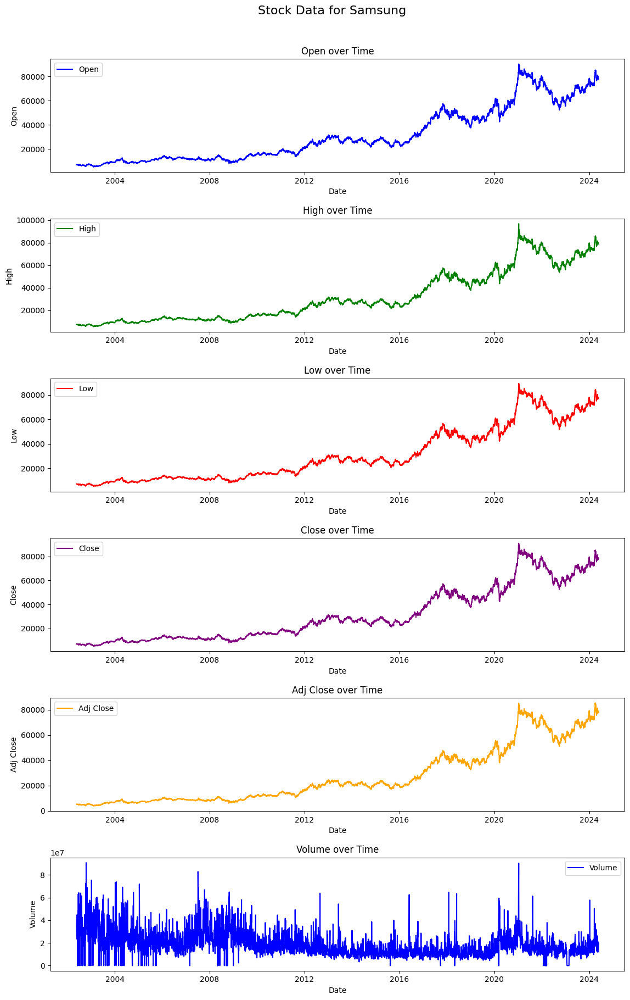

In [13]:
plot_by_source(df_filtered,'Samsung')

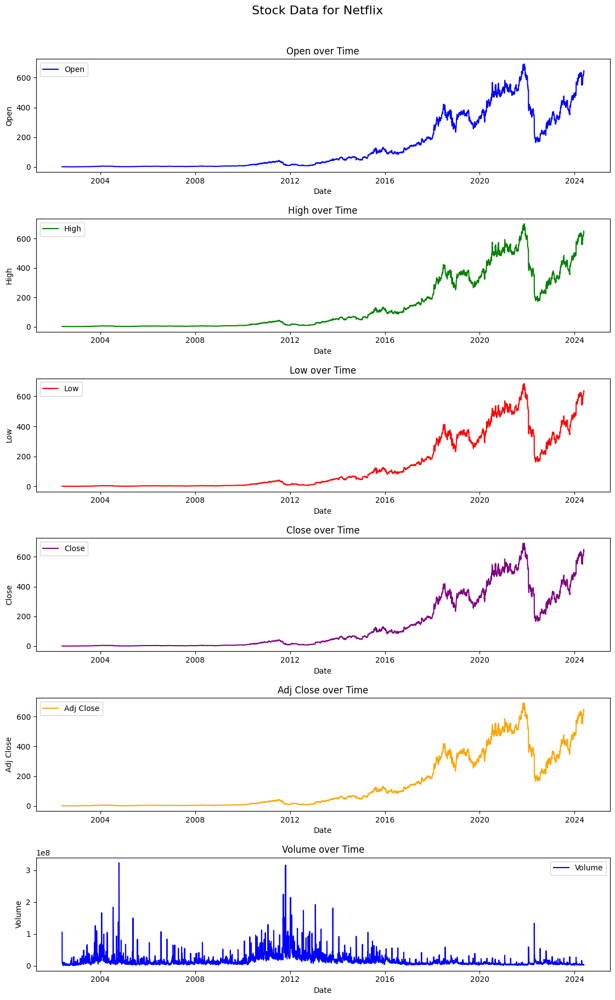

In [14]:
plot_by_source(df_filtered,'Netflix')

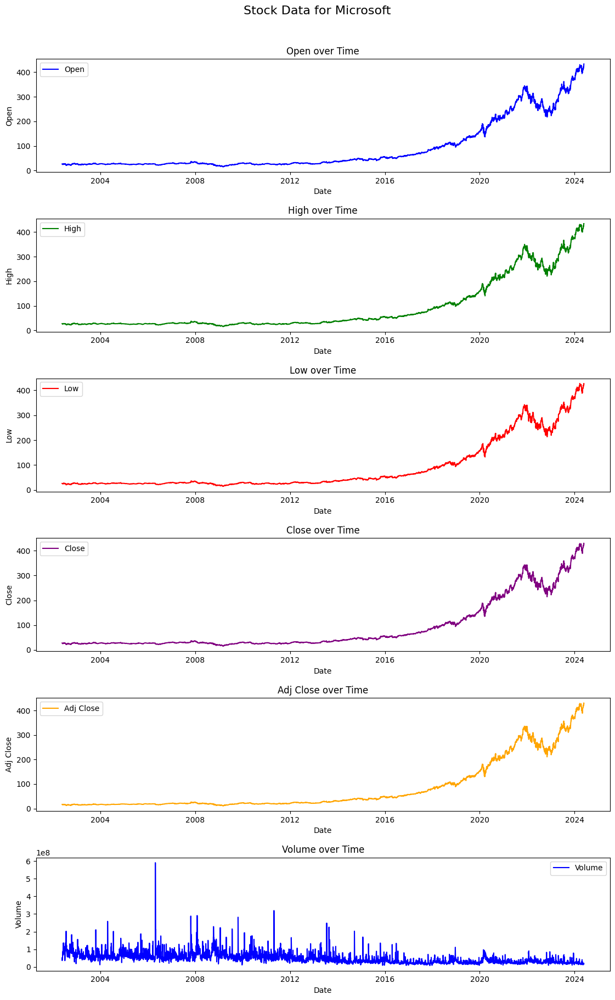

In [15]:
plot_by_source(df_filtered,'Microsoft')

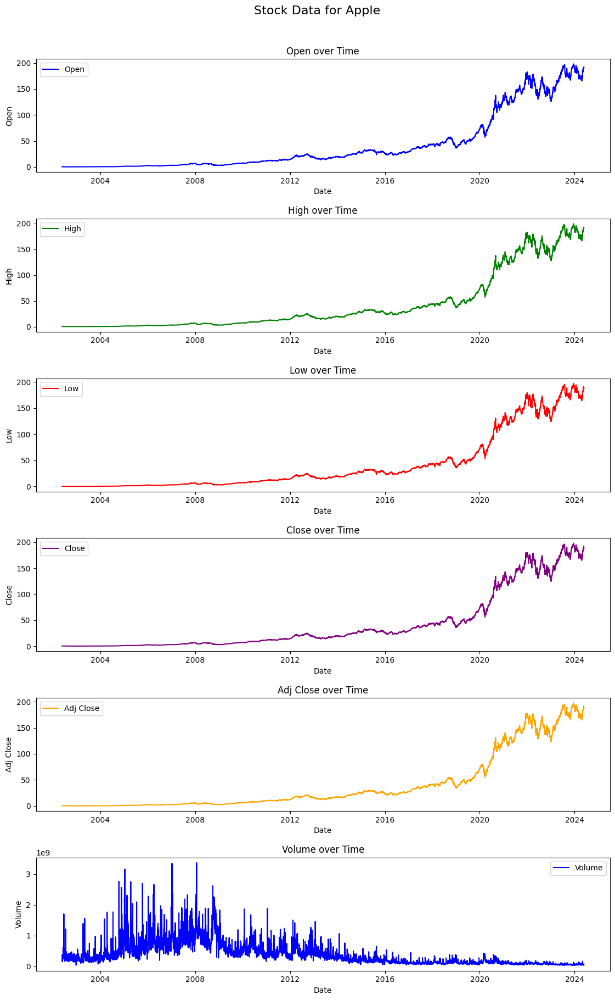

In [16]:
plot_by_source(df_filtered,'Apple')

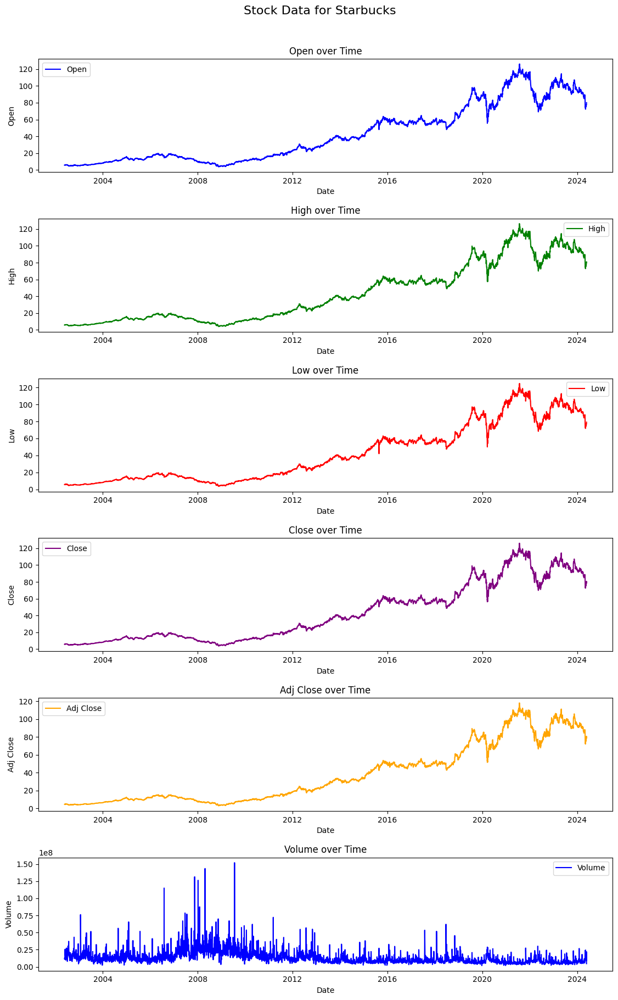

In [17]:
plot_by_source(df_filtered,'Starbucks')

# **Descriptive Statistics**

In [18]:
descriptive_stats = df_filtered.describe()
descriptive_stats

,Date,Open,High,Low,Close,Adj Close,Volume
count,26595,26595.000000,26595.000000,26595.000000,26595.000000,26595.000000,2.659500e+04
mean,2013-04-12 04:28:01.218274048,6239.612929,6298.903335,6177.478192,6237.281090,5405.059371,9.824879e+07
min,2002-05-23 00:00:00,0.231964,0.235536,0.227143,0.234286,0.198078,0.000000e+00
25%,2007-10-04 00:00:00,16.122679,16.341964,15.877679,16.128928,13.476648,1.074490e+07
50%,2013-03-22 00:00:00,48.230000,48.810001,47.715714,48.228573,44.879089,2.176160e+07
75%,2018-10-24 00:00:00,325.914994,330.475006,321.190002,325.964996,323.762543,6.035585e+07
max,2024-05-23 00:00:00,90300.000000,96800.000000,89500.000000,91000.000000,85300.000000,3.372970e+09
std,NaN,15838.232605,15977.628814,15689.065516,15828.105663,14483.553166,2.290847e+08


In [19]:
# Function to calculate and print descriptive statistics for each stock
def descriptive_statistics(df, stock_name):
    df_stock = df[df['Source'] == stock_name]
    closing_prices = df_stock['Close']
    
    mean_price = closing_prices.mean()
    median_price = closing_prices.median()
    mode_price = closing_prices.mode()[0] if not closing_prices.mode().empty else np.nan
    std_dev = closing_prices.std()
    variance = closing_prices.var()
    min_price = closing_prices.min()
    max_price = closing_prices.max()
    
    print(f"Descriptive Statistics for {stock_name}:")
    print(f"Mean: {mean_price:.2f}")
    print(f"Median: {median_price:.2f}")
    print(f"Mode: {mode_price:.2f}")
    print(f"Standard Deviation: {std_dev:.2f}")
    print(f"Variance: {variance:.2f}")
    print(f"Minimum: {min_price:.2f}")
    print(f"Maximum: {max_price:.2f}")
    print("\n")

# Perform descriptive statistics for each stock
stocks = df_filtered['Source'].unique()

for stock in stocks:
    descriptive_statistics(df_filtered, stock)


Descriptive Statistics for Netflix:
Mean: 138.26
Median: 34.28
Mode: 1.61
Standard Deviation: 181.55
Variance: 32960.67
Minimum: 0.37
Maximum: 691.69


Descriptive Statistics for Starbucks:
Mean: 42.02
Median: 29.12
Mode: 5.00
Standard Deviation: 33.78
Variance: 1140.90
Minimum: 3.58
Maximum: 126.06


Descriptive Statistics for Microsoft:
Mean: 88.77
Median: 32.74
Mode: 27.25
Standard Deviation: 100.58
Variance: 10115.36
Minimum: 15.15
Maximum: 430.52


Descriptive Statistics for Apple:
Mean: 41.63
Median: 18.94
Mode: 0.27
Standard Deviation: 54.87
Variance: 3010.44
Minimum: 0.23
Maximum: 198.11


Descriptive Statistics for Samsung:
Mean: 30875.73
Median: 25080.00
Mode: 11300.00
Standard Deviation: 22222.06
Variance: 493820090.20
Minimum: 5390.00
Maximum: 91000.00




# **Moving Averages**

**Daily returns**

In [20]:
df_filtered['Daily Return'] = df_filtered.groupby('Source')['Close'].pct_change()
df_filtered.sample(20)

,Date,Open,High,Low,Close,Adj Close,Volume,Source,Daily Return
23177,2021-07-06,278.029999,279.369995,274.299988,277.660004,270.657135,31565600,Microsoft,0.000036
19099,2018-02-01,50620.000000,50960.000000,49720.000000,49820.000000,41889.328125,27609450,Samsung,-0.001603
2921,2004-09-17,11.457500,11.572500,11.417500,11.512500,8.934228,8795600,Starbucks,0.009426
9162,2009-10-19,26.490000,26.580000,26.250000,26.360001,19.833000,48143200,Microsoft,-0.005283
25231,2023-03-30,101.440002,101.699997,100.650002,101.320000,98.392227,4082600,Starbucks,0.006957
14087,2013-11-18,37.349998,37.580002,37.070000,37.200001,30.975466,53277500,Microsoft,-0.016913
11194,2011-06-22,16480.000000,16660.000000,16440.000000,16520.000000,12735.886719,16530400,Samsung,0.014742
24605,2022-09-21,242.669998,248.300003,236.679993,236.869995,236.869995,9166800,Netflix,-0.024624
22436,2020-11-20,97.419998,97.540001,96.949997,97.010002,90.072060,4609700,Starbucks,-0.007672
222,2002-07-26,21.870001,22.705000,21.840000,22.674999,14.006468,123538000,Microsoft,0.058837


**30 days moving average**

In [21]:
df_filtered['30 Day MA'] = df_filtered.groupby('Source')['Close'].transform(lambda x: x.rolling(window=30).mean())
df_filtered.sample(20)

,Date,Open,High,Low,Close,Adj Close,Volume,Source,Daily Return,30 Day MA
5536,2006-10-30,19.004999,19.150000,18.809999,19.070000,14.799202,7522600,Starbucks,0.003156,18.116000
21913,2020-06-17,88.787498,88.849998,87.772499,87.897499,85.842026,114406400,Apple,-0.001392,80.797500
6865,2007-12-06,3.354286,3.414286,3.331429,3.414286,3.414286,6832000,Netflix,-0.001253,3.502857
23276,2021-08-03,120.570000,120.750000,117.519997,119.129997,111.522942,6030500,Starbucks,-0.010302,117.780000
19711,2018-08-09,51.529999,52.020000,51.320000,51.919998,46.114498,7175400,Starbucks,0.007177,50.869333
921,2003-02-14,5.502500,5.650000,5.490000,5.630000,4.369139,15174000,Starbucks,0.025968,5.384833
22869,2021-04-05,85800.000000,86000.000000,84800.000000,85400.000000,80167.851563,16255990,Samsung,0.030157,82350.000000
11545,2011-10-07,17.571428,17.740000,16.714287,16.744286,16.744286,40393500,Netflix,-0.048929,24.512762
18328,2017-06-08,38.812500,38.884998,38.599998,38.747501,36.270596,85003200,Apple,-0.002446,37.744499
12662,2012-09-07,31.040001,31.070000,30.730000,30.950001,24.998632,42649100,Microsoft,-0.012759,30.304333


**50 days moving average**

In [22]:
df_filtered['50 Day MA'] = df_filtered.groupby('Source')['Close'].transform(lambda x: x.rolling(window=50).mean())
df_filtered.sample(20)

,Date,Open,High,Low,Close,Adj Close,Volume,Source,Daily Return,30 Day MA,50 Day MA
4355,2005-11-04,3.871429,3.964286,3.845714,3.941429,3.941429,7023800,Netflix,0.018833,3.802952,3.599686
22308,2020-10-15,118.720001,121.199997,118.150002,120.709999,118.099770,112559200,Apple,-0.003961,116.759249,116.001350
15694,2015-03-26,29000.000000,29120.000000,28420.000000,28420.000000,22712.421875,21005950,Samsung,-0.043098,28446.000000,27951.600000
7267,2008-04-11,28.870001,29.010000,28.209999,28.280001,20.583229,54373700,Microsoft,-0.028513,28.488667,28.930200
16877,2016-03-18,54.919998,54.970001,53.450001,53.490002,47.701618,67625500,Microsoft,-0.021405,52.214666,52.368400
19449,2018-05-21,49650.000000,50200.000000,49100.000000,50000.000000,42348.500000,9020998,Samsung,0.010101,50782.333333,50461.400000
7866,2008-10-01,7.280000,7.530000,7.260000,7.400000,5.742739,20794000,Starbucks,-0.004707,7.699667,7.675500
24486,2022-08-12,87.309998,88.400002,87.190002,88.309998,84.842995,5154000,Starbucks,0.011917,82.536333,79.873400
6292,2007-06-15,30.860001,30.879999,30.430000,30.490000,21.956055,100933000,Microsoft,-0.000983,30.627333,29.866400
17958,2017-02-13,33.270000,33.455002,33.187500,33.322498,31.064161,92141600,Apple,0.008856,30.638500,29.723250


**90 days moving average**

In [23]:
df_filtered['90 Day MA'] = df_filtered.groupby('Source')['Close'].transform(lambda x: x.rolling(window=90).mean())
df_filtered.sample(20)

,Date,Open,High,Low,Close,Adj Close,Volume,Source,Daily Return,30 Day MA,50 Day MA,90 Day MA
21444,2020-01-28,59400.000000,59400.000000,58300.000000,58800.000000,52534.839844,23664541,Samsung,-0.032895,57016.666667,54845.000000,52586.666667
5791,2007-01-17,18.129999,18.260000,18.094999,18.145000,14.081353,12711200,Starbucks,0.001933,17.967333,18.216000,17.954833
13412,2013-04-25,31.709999,32.840000,31.540001,31.940001,26.225607,110700200,Microsoft,0.005668,29.003334,28.560200,27.974000
15027,2014-09-02,45.430000,45.459999,44.849998,45.090000,38.622292,22976800,Microsoft,-0.007484,44.260001,43.472000,42.096556
12030,2012-03-05,16.385714,16.645714,15.815714,15.830000,15.830000,27605200,Netflix,-0.037272,16.700143,14.563829,13.230937
20205,2019-01-11,330.959991,341.089996,328.519989,337.589996,337.589996,19500400,Netflix,0.039826,278.383332,283.940200,314.210333
21632,2020-03-23,137.009995,140.570007,132.520004,135.979996,130.914703,78975200,Microsoft,-0.009975,164.364334,166.273200,160.163333
12768,2012-10-10,22.847857,23.035000,22.750000,22.889643,19.435200,510356000,Apple,0.007958,24.045822,23.419686,22.329480
25422,2023-05-26,324.019989,333.399994,323.880005,332.890015,330.306122,36630600,Microsoft,0.021386,304.051333,294.593400,275.997445
839,2003-01-22,6290.000000,6370.000000,6180.000000,6230.000000,4537.104004,32670000,Samsung,-0.023511,6809.666667,7018.000000,6762.888889


**200 days moving average**

In [24]:
df_filtered['200 Day MA'] = df_filtered.groupby('Source')['Close'].transform(lambda x: x.rolling(window=200).mean())
df_filtered.sample(20)

,Date,Open,High,Low,Close,Adj Close,Volume,Source,Daily Return,30 Day MA,50 Day MA,90 Day MA,200 Day MA
17019,2016-04-29,25200.000000,25340.000000,24840.000000,24900.000000,20234.587891,16253900,Samsung,-0.015810,25646.000000,25026.800000,24536.888889,24451.000000
22457,2020-11-27,214.850006,216.270004,214.039993,215.229996,208.837357,14512200,Microsoft,0.006359,213.211999,211.572800,211.613111,193.104400
4589,2006-01-13,13540.000000,13880.000000,13360.000000,13840.000000,10079.210938,23698600,Samsung,0.008746,12871.333333,12557.600000,12151.111111,11117.550000
2208,2004-02-24,0.395357,0.406071,0.392857,0.399286,0.337578,259056000,Apple,0.007662,0.407774,0.395075,0.394121,0.376315
16147,2015-08-07,46.389999,46.779999,46.259998,46.740002,40.838543,19163000,Microsoft,0.002574,45.751000,45.936400,45.541333,45.449050
11059,2011-05-12,17720.000000,18020.000000,17660.000000,17700.000000,13645.591797,27616100,Samsung,-0.007848,18160.000000,18057.200000,18494.444444,17124.800000
17508,2016-09-28,28.422501,28.660000,28.357500,28.487499,26.307129,118564400,Apple,0.007605,27.270667,26.640800,25.531778,25.729275
23439,2021-09-23,77500.000000,77600.000000,76800.000000,77400.000000,72979.664063,17055590,Samsung,0.002591,76160.000000,77576.000000,78920.000000,80076.500000
6950,2008-01-04,3.720000,3.795714,3.478571,3.515714,3.515714,17202500,Netflix,-0.056003,3.467905,3.544486,3.223698,3.096521
23551,2021-10-28,113.739998,114.599998,112.459999,113.199997,106.382904,7697600,Starbucks,-0.002731,113.539666,114.587400,115.652667,111.851600


# **Trend Analysis**

In [25]:
df_filtered.set_index('Date', inplace=True)

In [26]:
# Function to perform trend analysis for a given stock
def trend_analysis(df, stock_name):
    df_stock = df[df['Source'] == stock_name].copy()
    
    # Use the date index directly for linear regression
    df_stock.loc[:, 'Date_num'] = (df_stock.index - df_stock.index.min()).days
    
    # Linear regression to quantify trend
    X = df_stock['Date_num'].values.reshape(-1, 1)
    y = df_stock['Close'].values
    model = LinearRegression().fit(X, y)
    trend = model.predict(X)

    plt.figure(figsize=(14, 7))
    sns.lineplot(x=df_stock.index, y=df_stock['Close'], label='Closing Price')
    sns.lineplot(x=df_stock.index, y=trend, label='Trend', linestyle='--')
    plt.title(f'Trend Analysis for {stock_name}')
    plt.xlabel('Date')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.show()

    # Determine trend direction based on slope
    slope = model.coef_[0]
    trend_direction = 'Increasing' if slope > 0 else 'Decreasing' if slope < 0 else 'Stable'
    print(f"Trend for {stock_name}: {trend_direction} (Slope: {slope:.2f})")

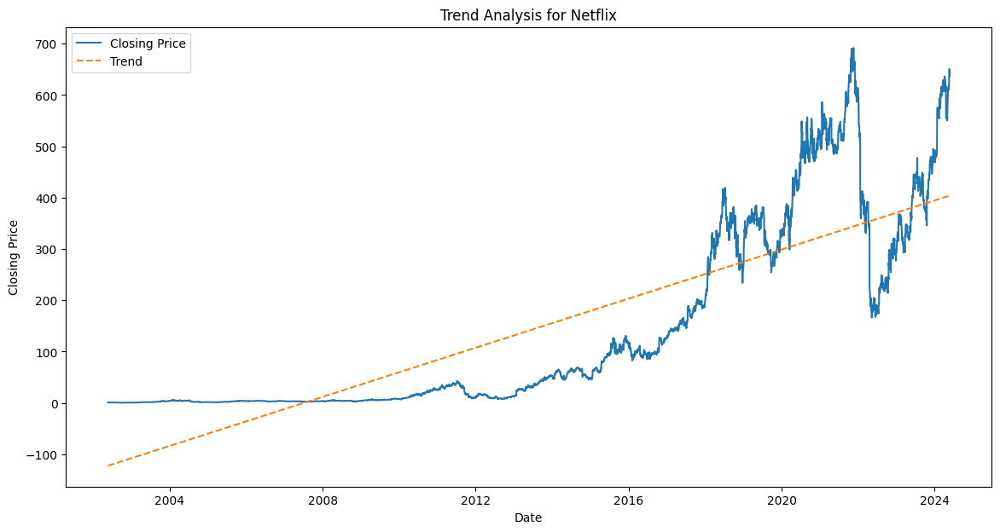

Trend for Netflix: Increasing (Slope: 0.07)


In [27]:
trend_analysis(df_filtered, 'Netflix')

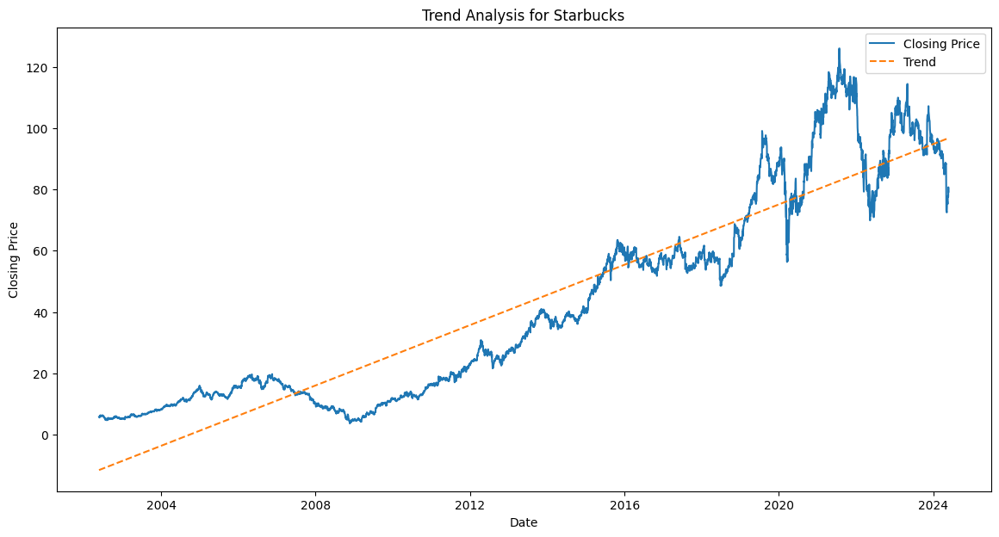

Trend for Starbucks: Increasing (Slope: 0.01)


In [28]:
trend_analysis(df_filtered, 'Starbucks')

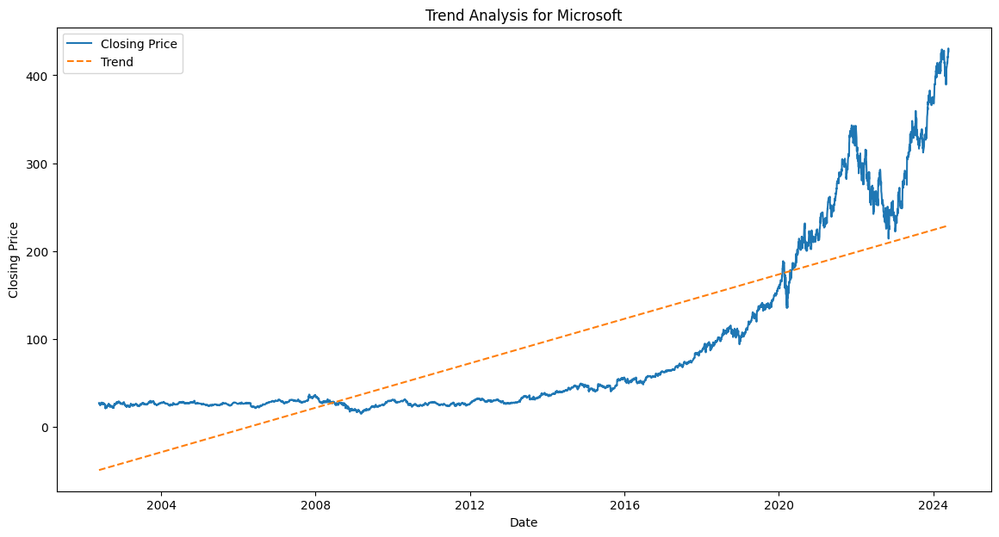

Trend for Microsoft: Increasing (Slope: 0.03)


In [29]:
trend_analysis(df_filtered, 'Microsoft')

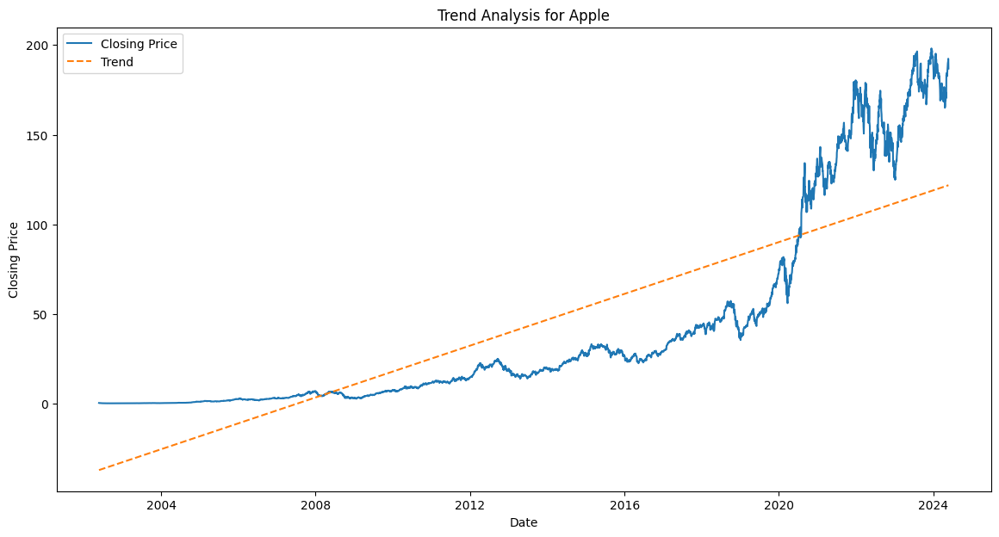

Trend for Apple: Increasing (Slope: 0.02)


In [30]:
trend_analysis(df_filtered, 'Apple')

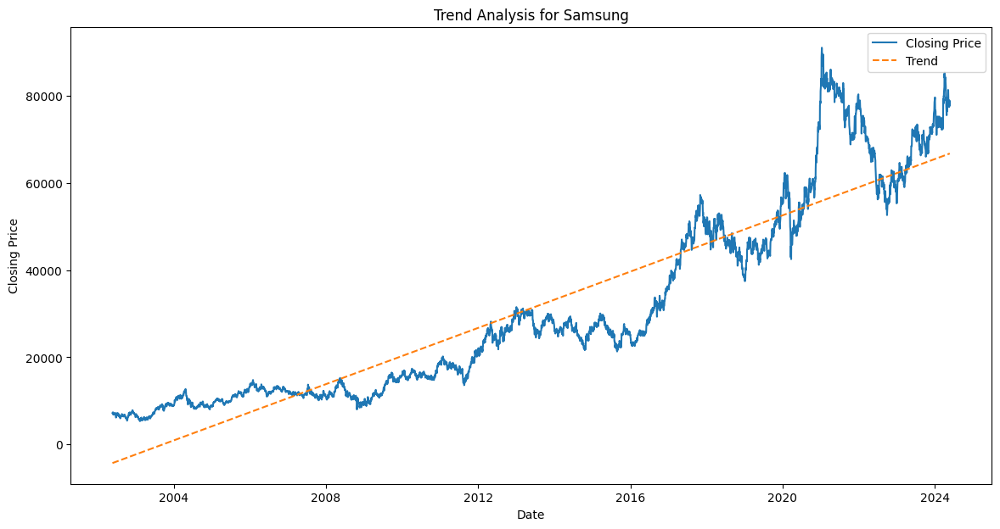

Trend for Samsung: Increasing (Slope: 8.83)


In [31]:
trend_analysis(df_filtered, 'Samsung')

**Comparison of Trends**
From the trend analysis, I observed that all the stocks exhibit an increasing trend. The slope of the trend line indicates the rate at which the stock prices are increasing over time.

**Samsung:** The highest slope (8.83), indicating a very strong upward trend. This suggests that Samsung's stock price is increasing rapidly compared to the others.

**Netflix:** The second highest slope (0.07), showing a moderate upward trend.

**Microsoft:** A moderate upward trend with a slope of (0.03).

**Apple:** Similar to Microsoft, showing a moderate upward trend with a slope of (0.02).

**Starbucks:** The lowest slope (0.01) among the analyzed stocks, indicating a gentle upward trend.


**Predictions Based on Trends**

**Samsung:** With the highest slope, Samsung's stock price is expected to continue rising at a rapid pace.
*Prediction:* Significant growth potential, likely to yield higher returns in the short to medium term.

**Netflix:**
A moderate upward trend indicates steady growth. Netflix's stock price is expected to rise, though not as rapidly as Samsung's.
*Prediction:* Steady growth, making it a stable investment option.

**Microsoft:**
Similar to Netflix, with a moderate upward trend. Microsoft's stock price is expected to continue its steady increase.
*Prediction:* Consistent growth, a reliable option for long-term investment.

**Apple:**
With a slope close to that of Microsoft, Apple shows a steady upward trend. The stock price is expected to increase gradually.
*Prediction:* Steady and reliable growth, suitable for long-term investors.

**Starbucks:**
The gentlest upward trend among the stocks analyzed. Starbucks' stock price is expected to grow, but at a slower rate compared to the others.
*Prediction:* Gradual growth, less volatility, suitable for conservative investors.

# **Seasonality**

In [32]:
# Function to perform seasonal decomposition for a given stock
def seasonal_decomposition(df, stock_name):
    df_stock = df[df['Source'] == stock_name].copy()
    
    # Ensure the data is in a time series format and sorted by date
    df_stock = df_stock.sort_index()
    
    # Perform seasonal decomposition
    decomposition = seasonal_decompose(df_stock['Close'], model='additive', period=365)
    
    # Plot the seasonal and residual components
    plt.figure(figsize=(14, 7))
    plt.subplot(211)
    plt.plot(decomposition.seasonal, label='Seasonal')
    plt.legend(loc='upper left')
    plt.subplot(212)
    plt.plot(decomposition.resid, label='Residual')
    plt.legend(loc='upper left')
    plt.tight_layout()
    plt.suptitle(f'Seasonal and Residual Components of {stock_name} Stock Prices', y=1.02)
    plt.show()

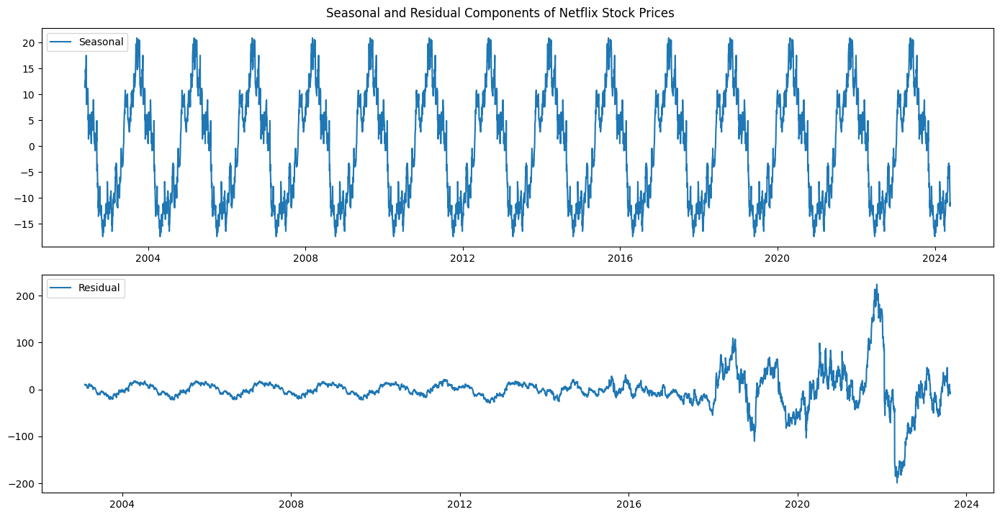

In [33]:
seasonal_decomposition(df_filtered, 'Netflix')

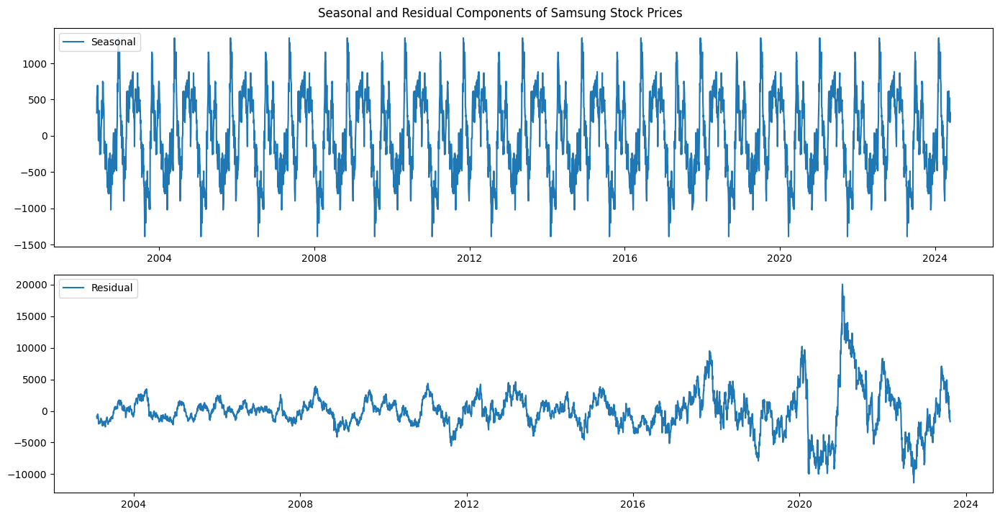

In [34]:
seasonal_decomposition(df_filtered, 'Samsung')

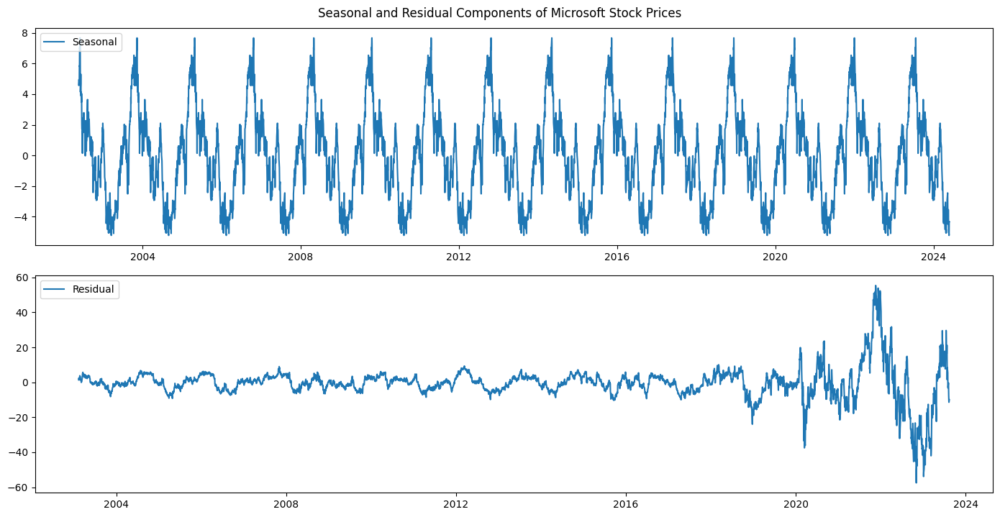

In [35]:
seasonal_decomposition(df_filtered, 'Microsoft')

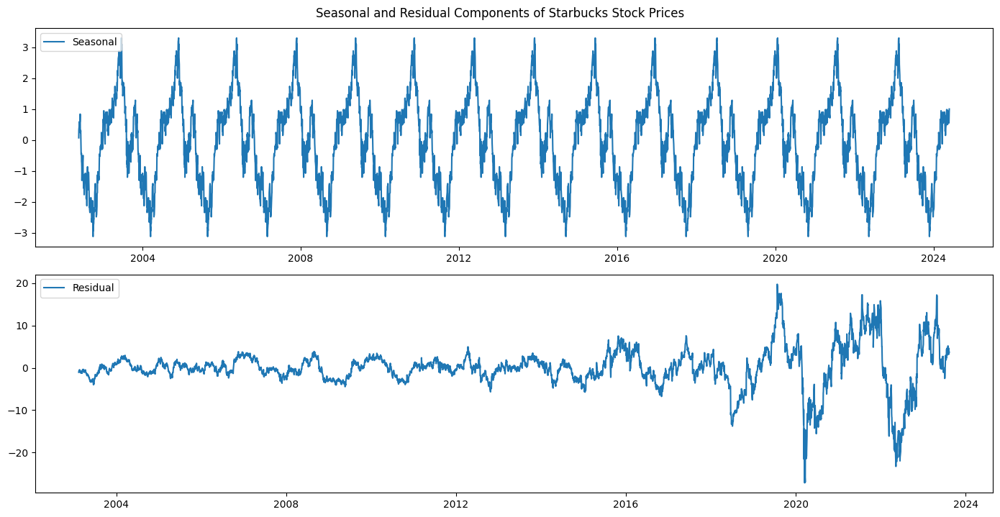

In [36]:
seasonal_decomposition(df_filtered, 'Starbucks')

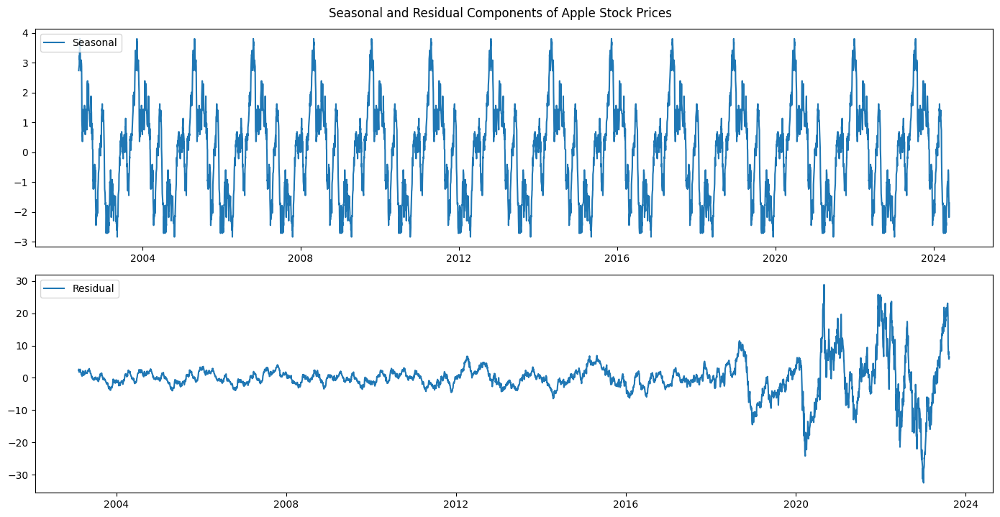

In [37]:
seasonal_decomposition(df_filtered, 'Apple')

**Seasonal:** If there are regular peaks and troughs in the seasonal plot, it indicates a repeating pattern, such as higher prices during certain months.

**Residual:** The residual plot should ideally show random noise with no apparent pattern, indicating that the trend and seasonal components have been adequately captured.

All the stocks follow seasonalality over 20 years.

# **Volatility analysis**

Volatility analysis in finance refers to assessing the degree of variation or fluctuation in the price of stock over a specific period. High volatility indicates that the price of the asset is experiencing large swings, while low volatility signifies more stable prices.

In [38]:
def calculate_volatility(df, stock_name, window=30):
    df_stock = df[df['Source'] == stock_name].copy()
    df_stock = df_stock.sort_index()
    
    # Calculate daily returns
    df_stock['Returns'] = df_stock['Close'].pct_change()
    
    # Calculate rolling standard deviation (volatility)
    df_stock['Volatility'] = df_stock['Returns'].rolling(window=window).std() * np.sqrt(window)
    
    # Plot volatility
    plt.figure(figsize=(14, 7))
    plt.plot(df_stock.index, df_stock['Volatility'], label='Volatility', color='red')
    plt.title(f'Volatility Analysis for {stock_name}')
    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.legend()
    plt.show()

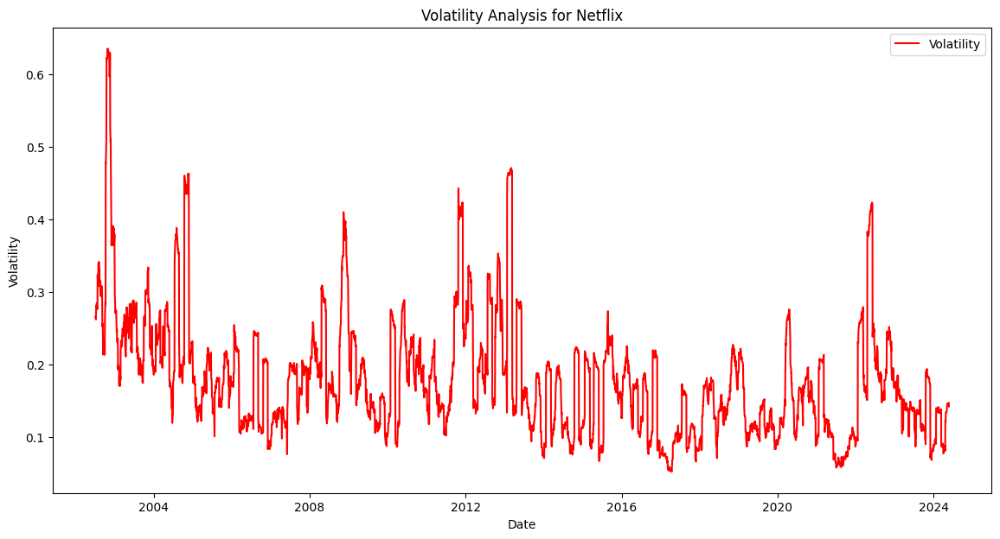

In [39]:
calculate_volatility(df_filtered, 'Netflix')

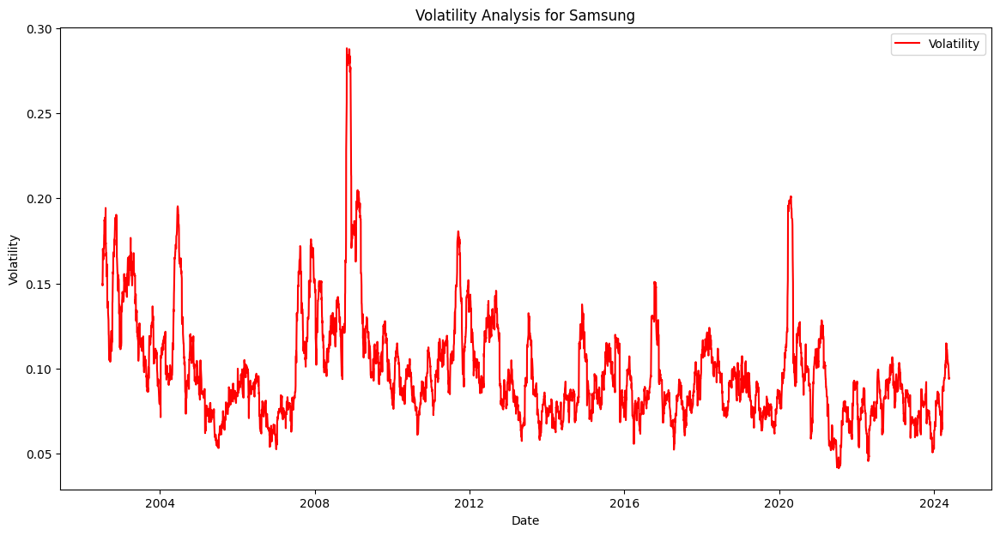

In [40]:
calculate_volatility(df_filtered, 'Samsung')

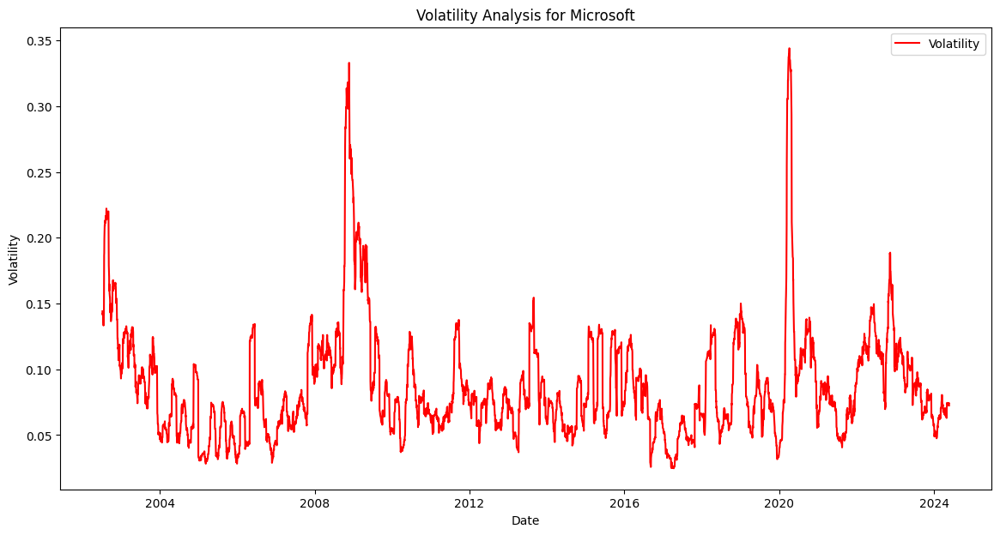

In [41]:
calculate_volatility(df_filtered, 'Microsoft')

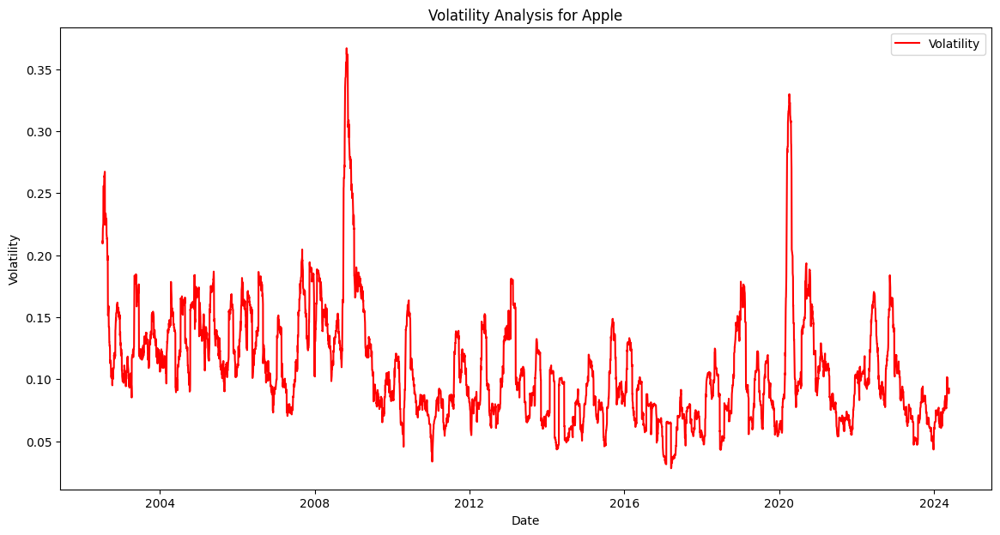

In [42]:
calculate_volatility(df_filtered, 'Apple')

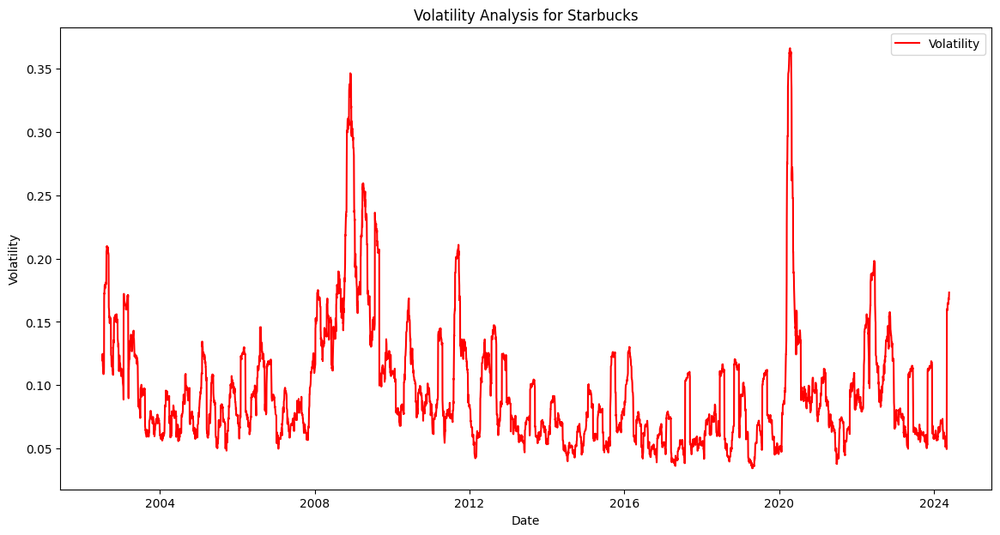

In [43]:
calculate_volatility(df_filtered, 'Starbucks')

We can observe that the stock prices of 'Samsung', 'Starbucks', 'Apple', 'Microsoft' shows high volatility over the period of 2008-2010 and 2020-2022. Whereas 'Netflix' shows high volatility over the 20 years.

In [44]:
def plot_volume_vs_close(df, source):
    # Filter the DataFrame for the specified source
    df_stock = df[df['Source'] == source].copy()

    # Create scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(df_stock['Volume'], df_stock['Close'], alpha=0.5)
    plt.title(f'Volume vs. Closing Price for {source}')
    plt.xlabel('Volume')
    plt.ylabel('Closing Price')
    plt.show()

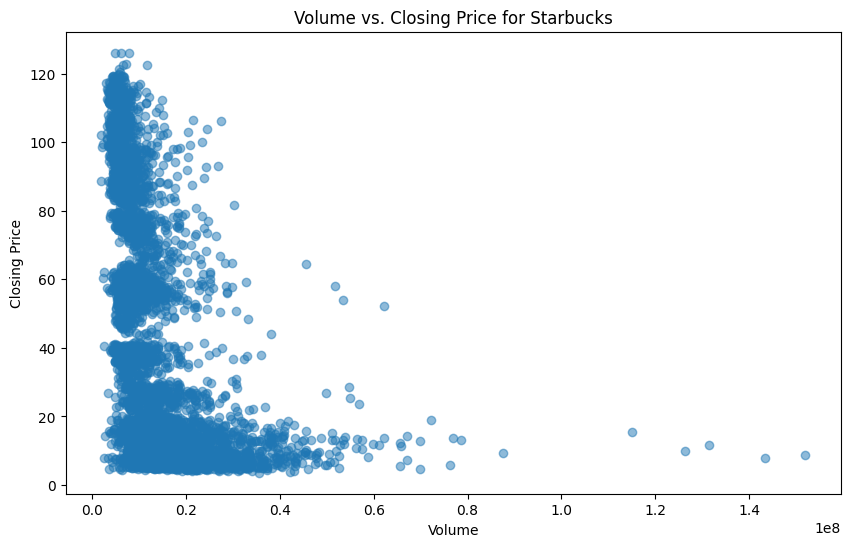

In [45]:
plot_volume_vs_close(df_filtered, 'Starbucks')

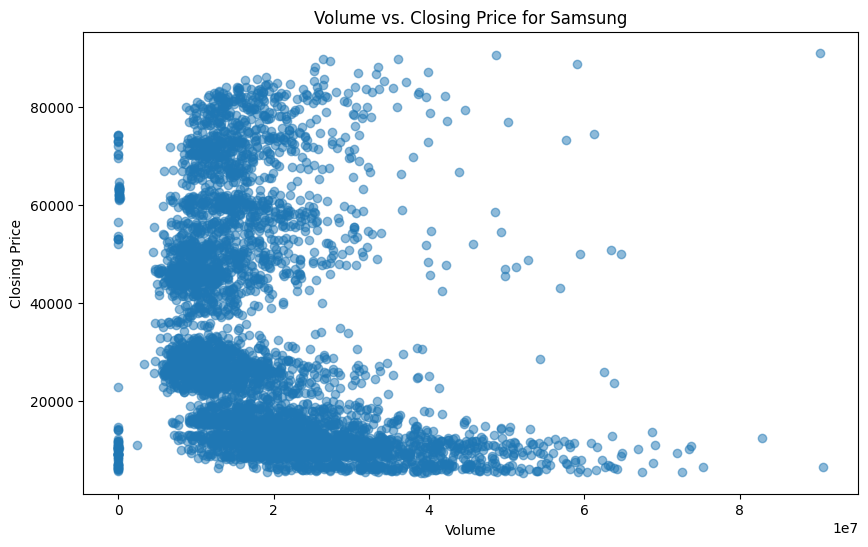

In [46]:
plot_volume_vs_close(df_filtered, 'Samsung')

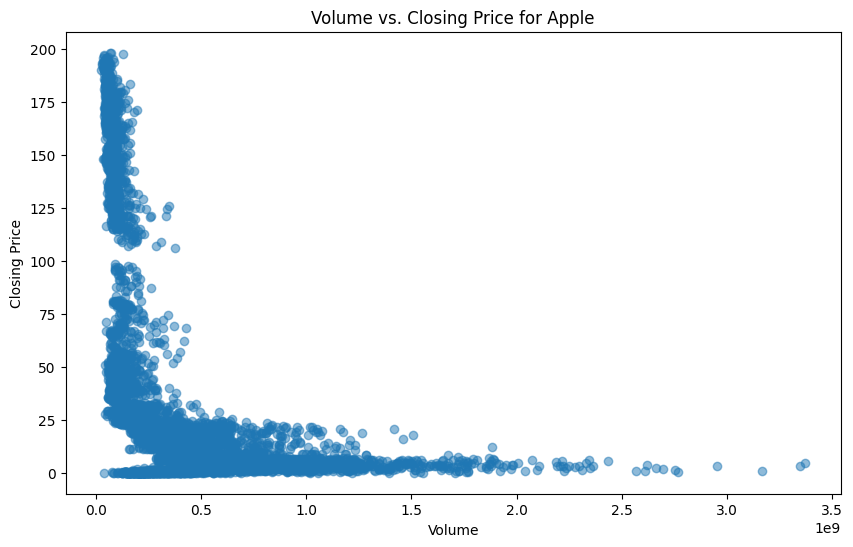

In [47]:
plot_volume_vs_close(df_filtered, 'Apple')

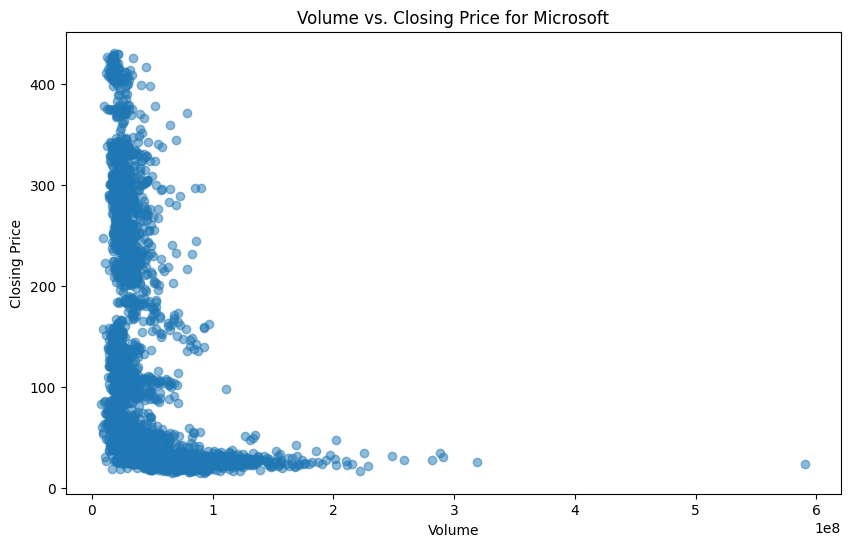

In [48]:
plot_volume_vs_close(df_filtered, 'Microsoft')

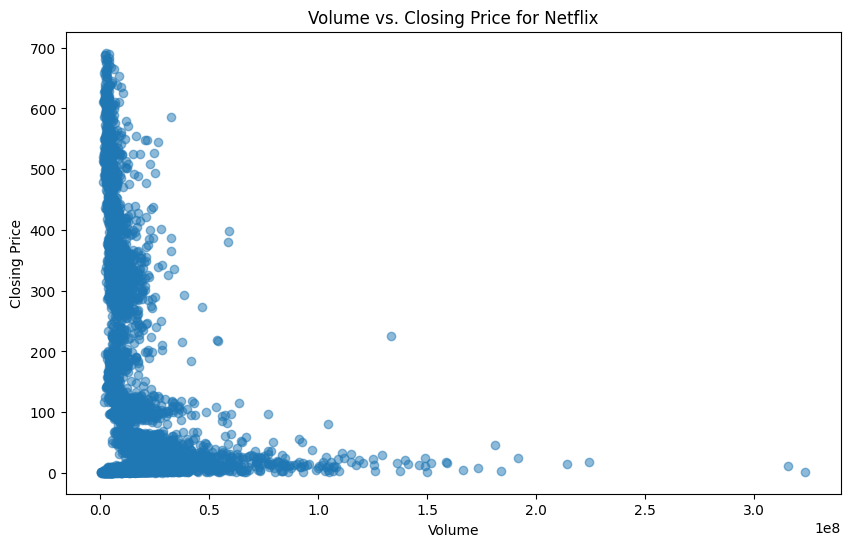

In [49]:
plot_volume_vs_close(df_filtered, 'Netflix')

In [50]:
def plot_close_distribution(df, source):
    # Filter the DataFrame for the specified source
    df_stock = df[df['Source'] == source].copy()

    # Create histogram with KDE
    plt.figure(figsize=(10, 6))
    sns.histplot(df_stock['Close'], kde=True, bins=30)
    plt.title(f'Distribution of Closing Prices for {source}')
    plt.xlabel('Closing Price')
    plt.ylabel('Frequency')
    plt.show()

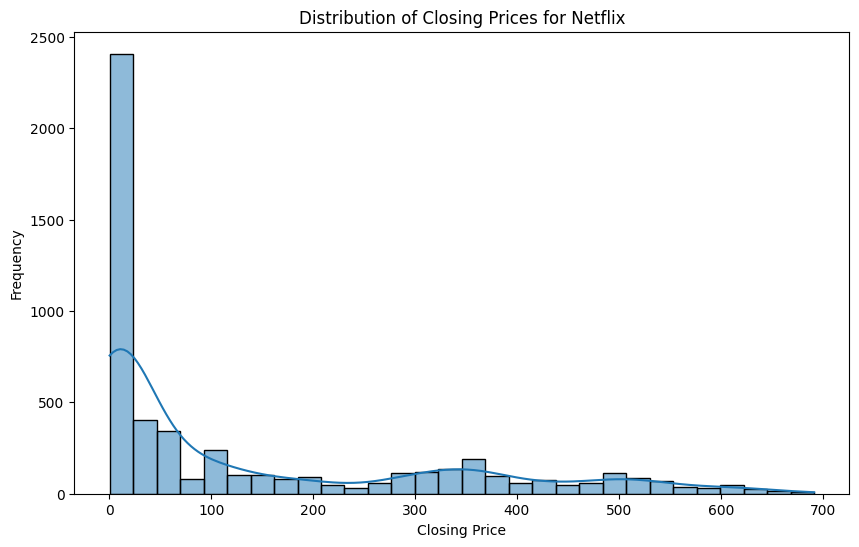

In [51]:
plot_close_distribution(df_filtered, 'Netflix')

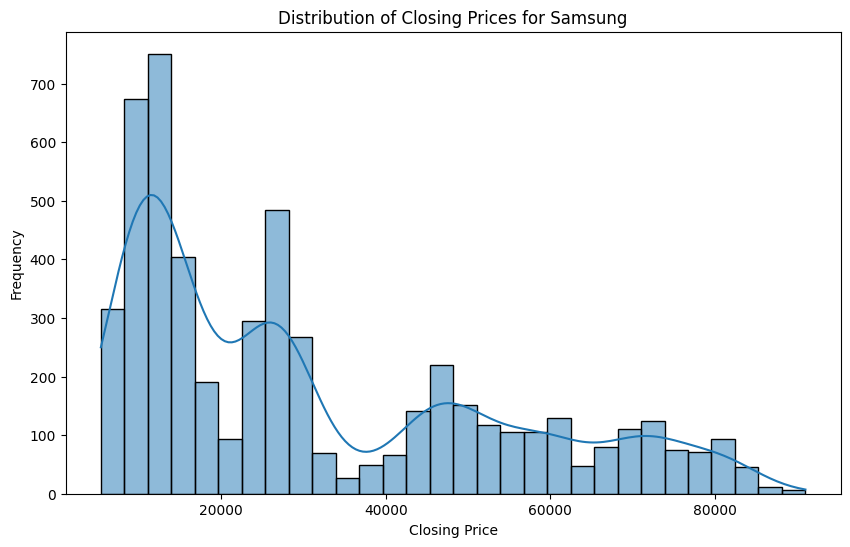

In [52]:
plot_close_distribution(df_filtered, 'Samsung')

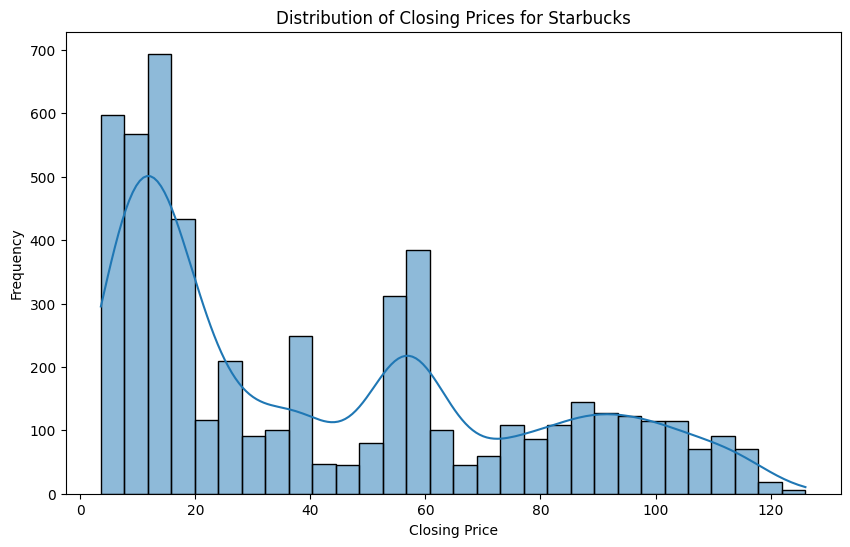

In [53]:
plot_close_distribution(df_filtered, 'Starbucks')

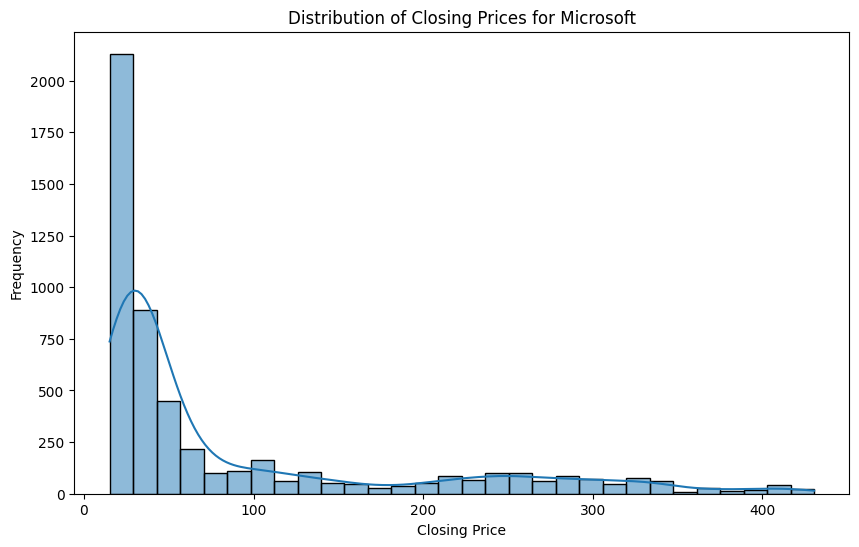

In [54]:
plot_close_distribution(df_filtered, 'Microsoft')

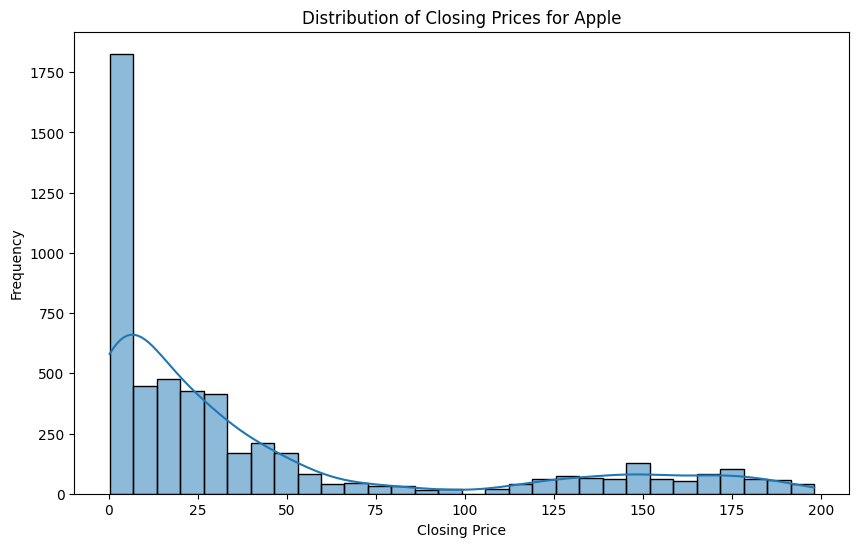

In [55]:
plot_close_distribution(df_filtered, 'Apple')

# **Prophet Model**

In [56]:
def prepare_data_for_prophet(df):
    # Convert index to a column and rename it
    df = df.reset_index()
    df = df.rename(columns={'index': 'Date', 'Close': 'y'})
    
    # Convert 'Date' column to datetime
    df['Date'] = pd.to_datetime(df['Date'])
    
    # Filter the dates
    df = df[df['Date'] >= '2020-01-01']
    
    # Rename columns for Prophet
    df = df.rename(columns={'Date': 'ds'})
    return df

def forecast_stock(df, train_size_ratio=0.8):
    # Split data into train and test sets
    train_size = int(len(df) * train_size_ratio)
    train = df[:train_size]
    test = df[train_size:]
    
    # Initialize and fit the model
    model = Prophet()
    model.fit(train)
    
    # Make future dataframe
    future = model.make_future_dataframe(periods=len(test), freq='D')
    forecast = model.predict(future)
    
    # Extract forecast for the test period
    forecast_test = forecast[-len(test):]
    
    return forecast, test, forecast_test

def plot_forecast(train, test, forecast_test, stock_name):
    comparison = test.copy()
    comparison['Predicted'] = forecast_test['yhat'].values
    
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(x=train['ds'], y=train['y'], mode='lines', name='Train'))
    fig.add_trace(go.Scatter(x=test['ds'], y=test['y'], mode='lines', name='Real (Test)'))
    fig.add_trace(go.Scatter(x=test['ds'], y=comparison['Predicted'], mode='lines', name='Predictions (Test)'))
    
    fig.update_layout(
        title=f'Forecasting with Prophet for {stock_name}',
        xaxis_title='Date',
        yaxis_title='Values',
        template='plotly_white',
        width=900, height=600
    )
    
    fig.show()

def run_prophet_forecasting(df, stock_name):
    df_prophet = prepare_data_for_prophet(df)
    forecast, test, forecast_test = forecast_stock(df_prophet)
    plot_forecast(df_prophet[:int(len(df_prophet) * 0.8)], test, forecast_test, stock_name)

23:51:08 - cmdstanpy - INFO - Chain [1] start processing
23:51:08 - cmdstanpy - INFO - Chain [1] done processing


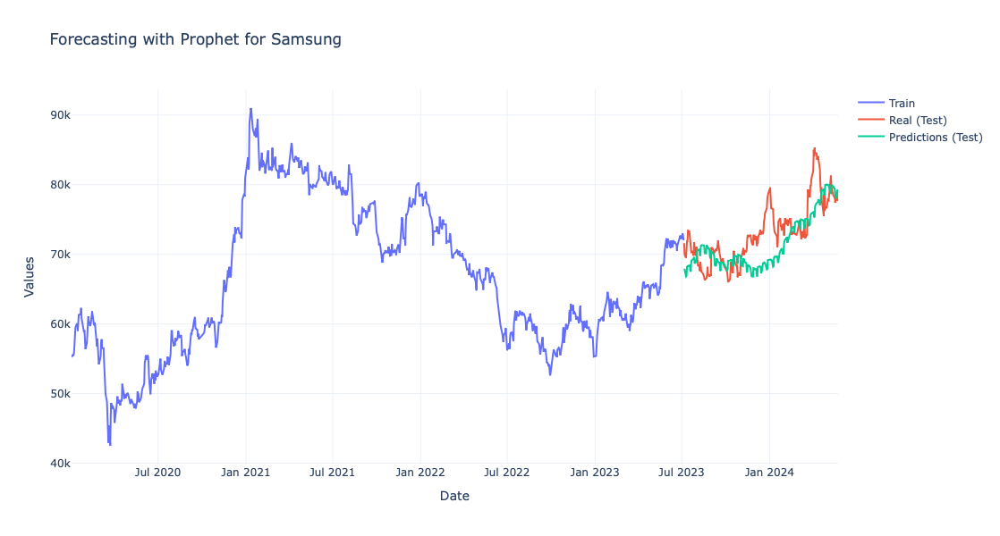

In [57]:
stock_df = df_filtered[df_filtered['Source'] == 'Samsung']
run_prophet_forecasting(stock_df, 'Samsung')

23:51:08 - cmdstanpy - INFO - Chain [1] start processing
23:51:09 - cmdstanpy - INFO - Chain [1] done processing


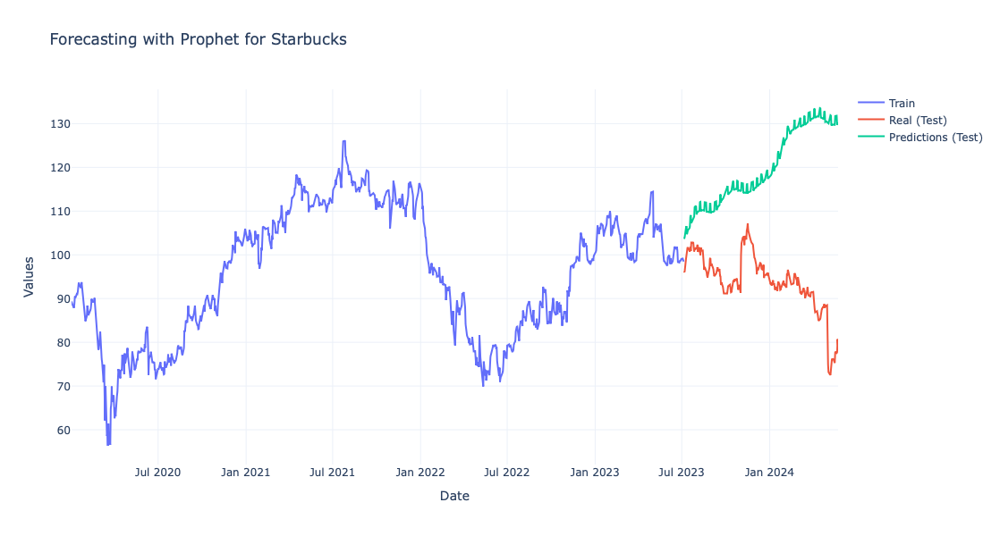

In [58]:
stock_df = df_filtered[df_filtered['Source'] == 'Starbucks']
run_prophet_forecasting(stock_df, 'Starbucks')

23:51:09 - cmdstanpy - INFO - Chain [1] start processing
23:51:09 - cmdstanpy - INFO - Chain [1] done processing


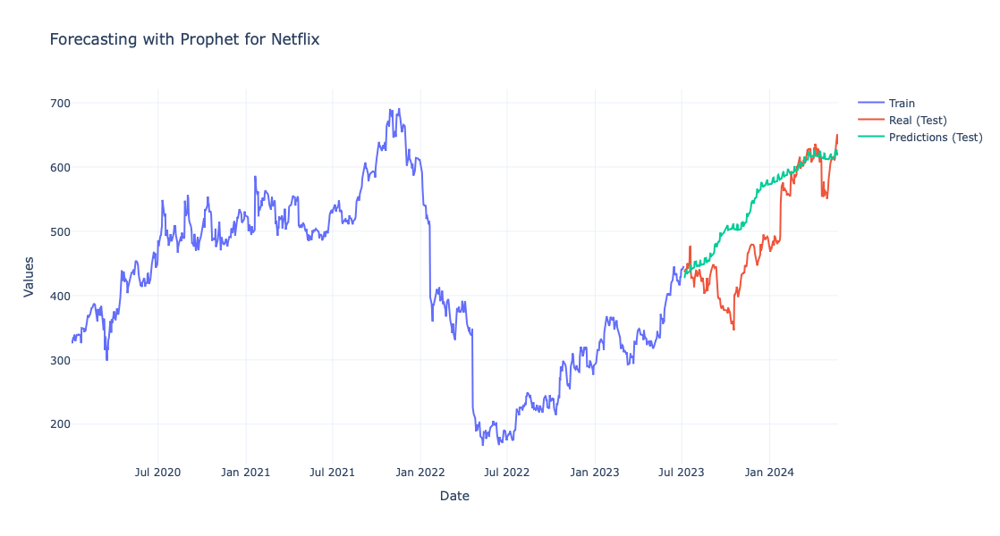

In [59]:
stock_df = df_filtered[df_filtered['Source'] == 'Netflix']
run_prophet_forecasting(stock_df, 'Netflix')

23:51:09 - cmdstanpy - INFO - Chain [1] start processing
23:51:10 - cmdstanpy - INFO - Chain [1] done processing


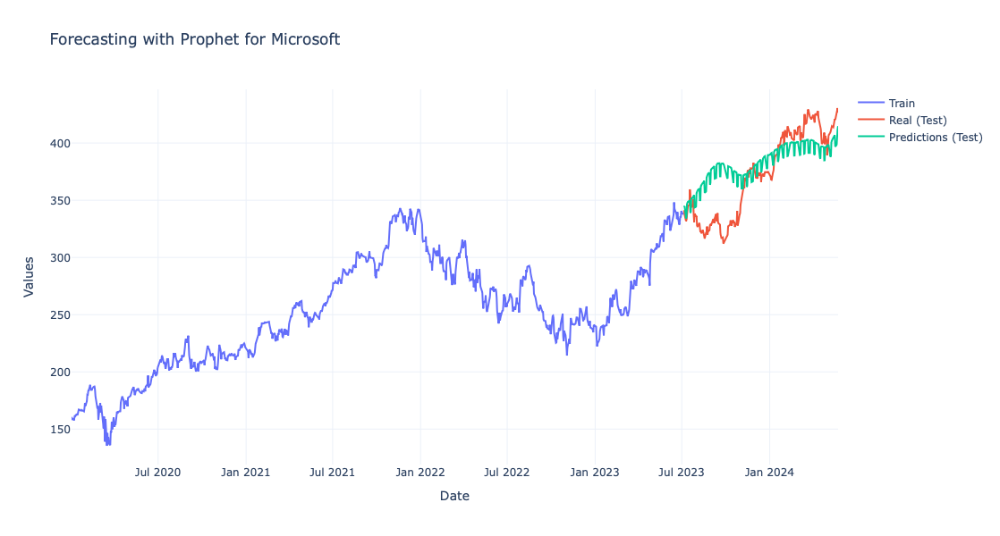

In [60]:
stock_df = df_filtered[df_filtered['Source'] == 'Microsoft']
run_prophet_forecasting(stock_df, 'Microsoft')

23:51:10 - cmdstanpy - INFO - Chain [1] start processing
23:51:10 - cmdstanpy - INFO - Chain [1] done processing


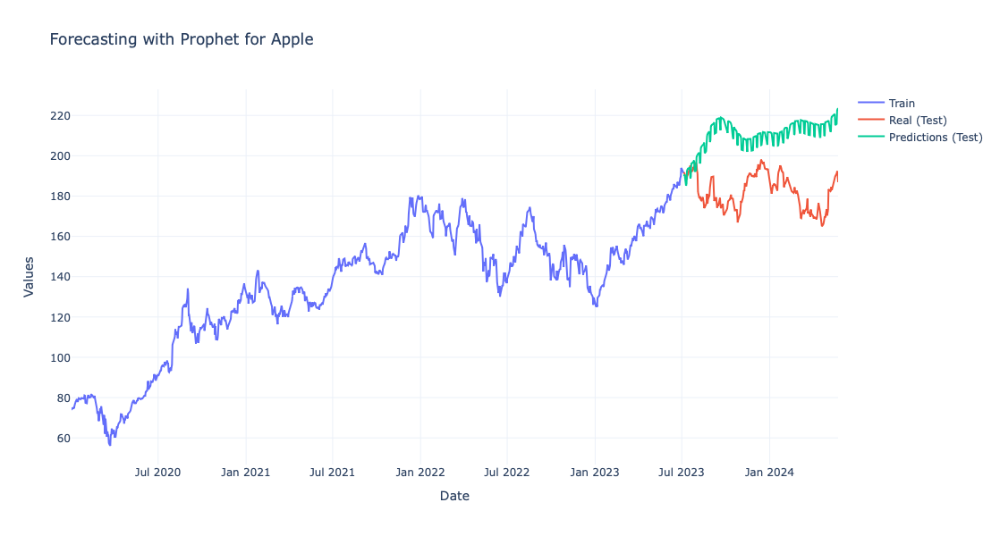

In [61]:
stock_df = df_filtered[df_filtered['Source'] == 'Apple']
run_prophet_forecasting(stock_df, 'Apple')

# **LSTM(Long Short-Term Memory)**

In [62]:
def prepare_data(df):

    # Prepare the data for LSTM by scaling the 'Close' prices.
    
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(df[['Close']])
    return scaled_data, scaler

def create_sequences(data, seq_length):
    # Create sequences of data for LSTM model input.
    
    xs = []
    ys = []
    for i in range(len(data) - seq_length):
        x = data[i:i + seq_length]
        y = data[i + seq_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

def train_lstm_model(X_train, y_train, seq_length):
    # Build and train the LSTM model.
    
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(seq_length, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(50))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2)
    return model, history

def plot_forecast(train, test, forecast_test, stock_name):
    # Plot the forecast results.
    
    comparison = test.copy()
    comparison['Predicted'] = forecast_test
    
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(x=train['Date'], y=train['Close'], mode='lines', name='Train'))
    fig.add_trace(go.Scatter(x=test['Date'], y=test['Close'], mode='lines', name='Real (Test)'))
    fig.add_trace(go.Scatter(x=test['Date'], y=comparison['Predicted'], mode='lines', name='Predictions (Test)'))
    
    fig.update_layout(
        title=f'Forecasting with LSTM for {stock_name}',
        xaxis_title='Date',
        yaxis_title='Values',
        template='plotly_white',
        width=900, height=600
    )
    
    fig.show()

def plot_loss(history):
    # Plot training and validation loss.

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    print(f'Loss: {loss}')
    print(f'Validation Loss: {val_loss}')
    
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(
        x=list(range(len(loss))),
        y=loss,
        mode='lines',
        name='Loss in train'
    ))
    
    fig.add_trace(go.Scatter(
        x=list(range(len(val_loss))),
        y=val_loss,
        mode='lines',
        name='Loss in validation'
    ))
    
    fig.update_layout(
        title='Loss in train and validation',
        xaxis_title='Epochs',
        yaxis_title='Loss',
        legend=dict(x=0, y=1.0)
    )
    
    fig.show()

def calculate_accuracy(y_test, y_pred):
    # Calculate accuracy of the predictions.

    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return mse, rmse, mape

def run_lstm_forecasting(stock_df, stock_name):
    # Run LSTM forecasting and plot results for a specific stock.
    
    # Prepare the data
    scaled_data, scaler = prepare_data(stock_df)
    
    # Create sequences
    seq_length = 30
    X, y = create_sequences(scaled_data, seq_length)
    
    # Split the data into training and test sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]
    
    # Reshape the data to fit the LSTM model input
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
    X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
    
    # Train the LSTM model
    model, history = train_lstm_model(X_train, y_train, seq_length)
    
    # Make predictions
    predicted = model.predict(X_test)
    predicted = scaler.inverse_transform(predicted)
    y_test = scaler.inverse_transform(y_test.reshape(-1, 1))
    
    # Plot the loss
    plot_loss(history)
    
    # Calculate accuracy
    mse, rmse, mape = calculate_accuracy(y_test, predicted)
    print(f'MSE for {stock_name}: {mse}')
    print(f'RMSE for {stock_name}: {rmse}')
    print(f'MAPE for {stock_name}: {mape}')
    
    # Prepare data for plotting forecast
    train_data = stock_df.iloc[:train_size + seq_length]
    test_data = stock_df.iloc[train_size + seq_length:]
    test_data = test_data.reset_index()
    
    # Plot the forecast
    plot_forecast(train_data.reset_index(), test_data, predicted, stock_name)

Epoch 1/20


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



106/106 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0024 - val_loss: 3.5339e-04
Epoch 2/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.2719e-04 - val_loss: 4.0273e-04
Epoch 3/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.2850e-04 - val_loss: 0.0023
Epoch 4/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.4096e-04 - val_loss: 8.9490e-04
Epoch 5/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.9029e-04 - val_loss: 3.9938e-04
Epoch 6/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.7751e-04 - val_loss: 6.2105e-04
Epoch 7/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.5958e-04 - val_loss: 4.2661e-04
Epoch 8/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3828e-04 - val_loss: 2.6259e-04
Epoch 9/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.3567e-04 - val_loss: 6.8425e-04
Epoch 10/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.1789e-04 - val_loss: 4.8866e-04
Epoch 11/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2335e-04 - val_

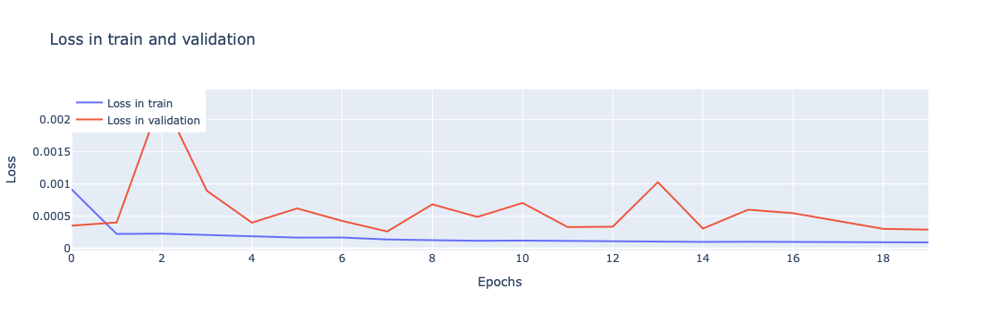

MSE for Samsung: 11714940.962031532
RMSE for Samsung: 3422.7095935868606
MAPE for Samsung: 0.04273931883282473


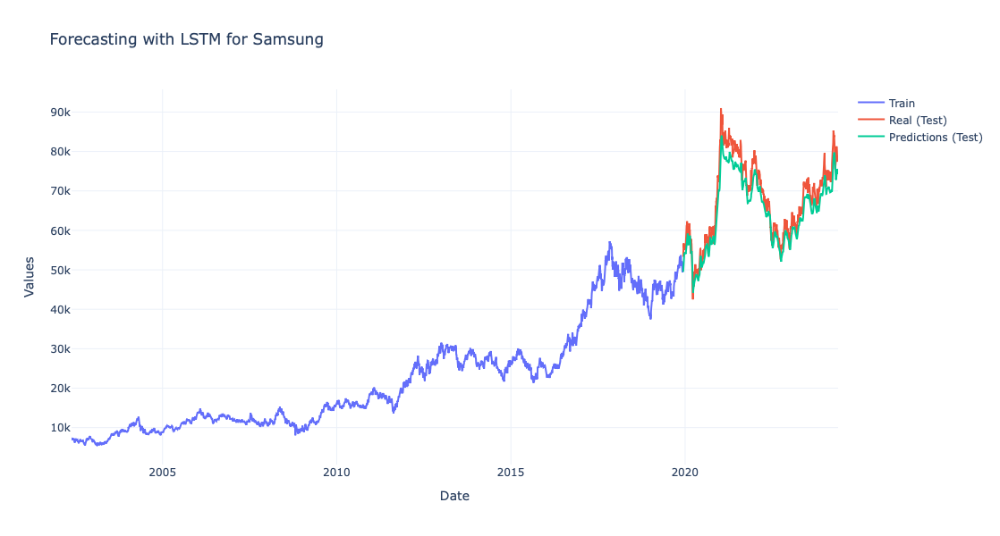

In [63]:
stock_df = df_filtered[df_filtered['Source'] == 'Samsung'][['Close']]
run_lstm_forecasting(stock_df, 'Samsung')

Epoch 1/20


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



106/106 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0056 - val_loss: 3.2487e-04
Epoch 2/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.4982e-04 - val_loss: 7.4944e-04
Epoch 3/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.6588e-04 - val_loss: 3.6791e-04
Epoch 4/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.8513e-04 - val_loss: 3.1995e-04
Epoch 5/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.5792e-04 - val_loss: 9.1064e-04
Epoch 6/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.0051e-04 - val_loss: 3.2324e-04
Epoch 7/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.5372e-04 - val_loss: 4.6767e-04
Epoch 8/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.7814e-04 - val_loss: 2.2808e-04
Epoch 9/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.0439e-04 - val_loss: 2.6807e-04
Epoch 10/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.1990e-04 - val_loss: 2.4059e-04
Epoch 11/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.9940e-04 - 

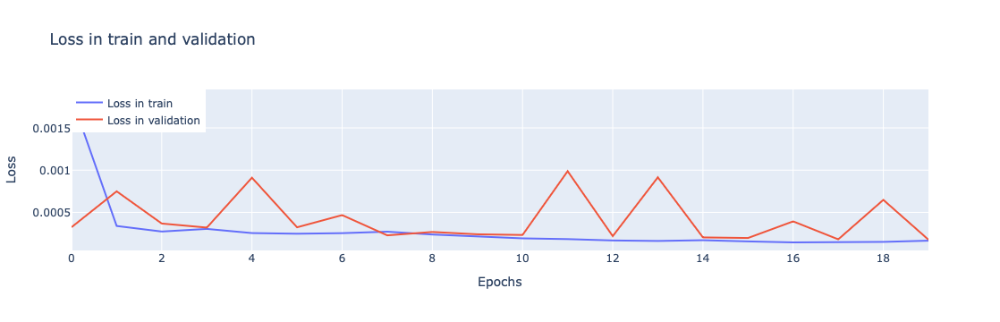

MSE for Starbucks: 11.122510383076673
RMSE for Starbucks: 3.3350427857940104
MAPE for Starbucks: 0.027556140934148796


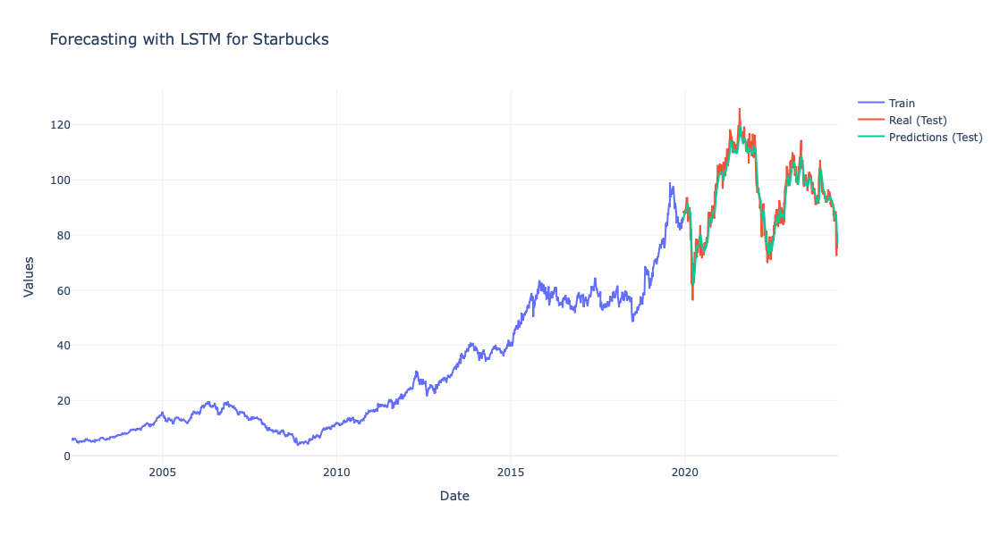

In [64]:
stock_df = df_filtered[df_filtered['Source'] == 'Starbucks'][['Close']]
run_lstm_forecasting(stock_df, 'Starbucks')

In [ ]:
stock_df = df_filtered[df_filtered['Source'] == 'Apple'][['Close']]
run_lstm_forecasting(stock_df, 'Apple')

Epoch 1/20


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



106/106 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 5.8110e-04 - val_loss: 1.3104e-04
Epoch 2/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.6239e-05 - val_loss: 8.0848e-05
Epoch 3/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.7376e-05 - val_loss: 8.7475e-05
Epoch 4/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.5939e-05 - val_loss: 8.7119e-05
Epoch 5/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.7563e-05 - val_loss: 7.8056e-05
Epoch 6/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.1068e-05 - val_loss: 5.8756e-05
Epoch 7/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.7318e-05 - val_loss: 1.1557e-04
Epoch 8/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.9350e-05 - val_loss: 1.0291e-04
Epoch 9/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.9934e-05 - val_loss: 5.2741e-05
Epoch 10/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.9168e-05 - val_loss: 2.0961e-04
Epoch 11/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.7463e-0

In [ ]:
stock_df = df_filtered[df_filtered['Source'] == 'Microsoft'][['Close']]
run_lstm_forecasting(stock_df, 'Microsoft')

In [ ]:
stock_df = df_filtered[df_filtered['Source'] == 'Netflix'][['Close']]
run_lstm_forecasting(stock_df, 'Netflix')

# **ARIMA**

In [ ]:
def test_stationarity(series):
    result = adfuller(series.dropna())
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')

# Function to forecast using ARIMA and plot separate graphs
def forecast_arima(df, stock_name, order=(5,1,0), forecast_steps=10):
    df_stock = df[df['Source'] == stock_name].copy()
    df_stock = df_stock.sort_index()

    # Ensure DateTime index has a frequency
    if df_stock.index.freq is None:
        df_stock = df_stock.asfreq('D', fill_value=np.nan)

    # Check if the series is stationary
    test_stationarity(df_stock['Close'])
    
    # Fit ARIMA model
    model = ARIMA(df_stock['Close'], order=order)
    model_fit = model.fit()

    # Forecast future values
    forecast = model_fit.forecast(steps=forecast_steps)
    
    # Generate future dates manually
    future_dates = pd.date_range(start=df_stock.index[-1] + pd.Timedelta(days=1), periods=forecast_steps, freq='D')

    # # Check if forecast and future_dates are correctly generated
    # print(f"Forecast values:\n{forecast}")
    # print(f"Future dates:\n{future_dates}")

    # Plot historical data
    plt.figure(figsize=(14, 7))
    plt.plot(df_stock.index, df_stock['Close'], label='Historical Data', color='blue')
    plt.title(f'Historical Data for {stock_name}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot forecast data
    plt.figure(figsize=(14, 7))
    plt.plot(future_dates, forecast, color='red', linestyle='--', marker='o', label='Forecast')
    plt.title(f'Forecast for {stock_name}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    return forecast

In [ ]:
forecast_netflix = forecast_arima(df_filtered, 'Netflix', order=(5,1,0), forecast_steps=30)
print(f"Forecasted values for Netflix: {forecast_netflix}")

In [ ]:
forecast_samsung = forecast_arima(df_filtered, 'Samsung', order=(5,1,0), forecast_steps=30)
print(f"Forecasted values for Samsung: {forecast_samsung}")

In [ ]:
forecast_starbucks = forecast_arima(df_filtered, 'Starbucks', order=(5,1,0), forecast_steps=30)
print(f"Forecasted values for Samsung: {forecast_starbucks}")

In [ ]:
forecast_microsoft = forecast_arima(df_filtered, 'Microsoft', order=(5,1,0), forecast_steps=30)
print(f"Forecasted values for Samsung: {forecast_microsoft}")

In [ ]:
forecast_apple = forecast_arima(df_filtered, 'Apple', order=(5,1,0), forecast_steps=30)
print(f"Forecasted values for Samsung: {forecast_apple}")